In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def science_plot(fontsize = 9):
    import scienceplots
    plt.style.use(['science','grid','notebook'])
    plt.rcParams.update({
        'font.size'       : fontsize,    # General font size
        'axes.titlesize'  : fontsize,    # Font size of the axes title
        'axes.labelsize'  : fontsize,    # Font size of the axes labels
        'xtick.labelsize' : fontsize,    # Font size of the x-axis tick labels
        'ytick.labelsize' : fontsize,    # Font size of the y-axis tick labels
        'legend.fontsize' : fontsize,    # Font size of the legend
        'figure.titlesize': fontsize,    # Font size of the figure title
        'legend.fancybox' : False,       # Disable the fancy box for legend
        'legend.edgecolor': 'k',         # Set legend border color to black
        'text.usetex'     : True,        # Use LaTeX for text rendering
        'font.family'     : 'serif'      # Set font family to serif
    })
science_plot() 
import cv2

In [24]:

def average3 (
        img1_path,
        img2_path,
        img3_path,
        title,
        filename, 
        display = True
    ):
    # Load images
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)
    img3 = cv2.imread(img3_path)

    # Convert images to float for averaging
    img1 = img1.astype(np.float32)
    img2 = img2.astype(np.float32)
    img3 = img3.astype(np.float32)

    # Compute the average
    avg_img = (img1 + img2 + img3) / 3

    # Convert back to uint8
    avg_img = np.clip(avg_img, 0, 255).astype(np.uint8)

    if display:
        # Save or display the result
        cv2.imwrite(rf"img\{filename}.png", avg_img)
        plt.imshow(avg_img[:,:,::-1])
        plt.title(f"{title}")
    return avg_img

def return_rgb(img, pos):
    y, x = pos  # y is the row (height), x is the column (width)
    color = img[y, x][::-1]  # Convert BGR (OpenCV) to RGB

    # Create a 10x10 grid of the color
    color_grid = np.full((10, 10, 3), color, dtype=np.uint8)

    # Display the grid with RGB values in the title
    plt.imshow(color_grid)
    plt.title(f"RGB: {color[0],color[1],color[2]}s")
    plt.show()

    return tuple(color)

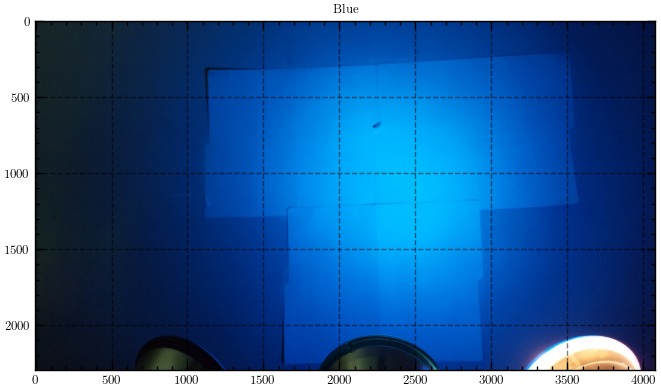

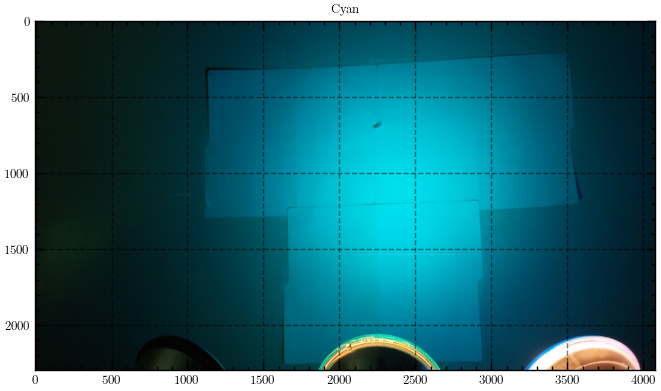

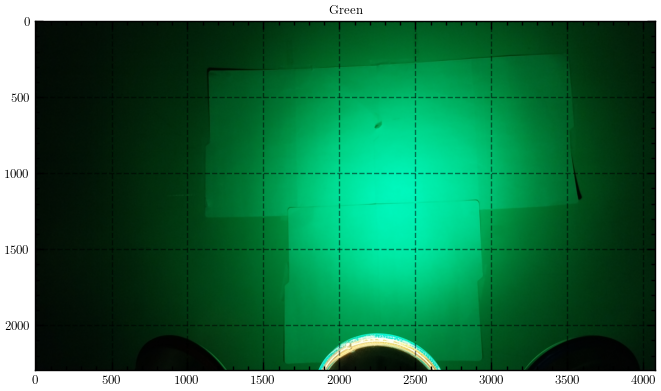

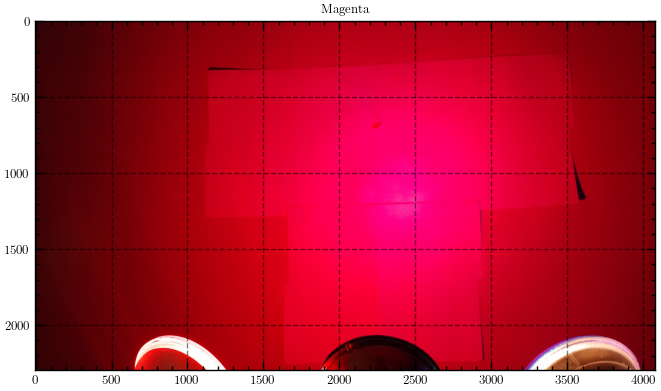

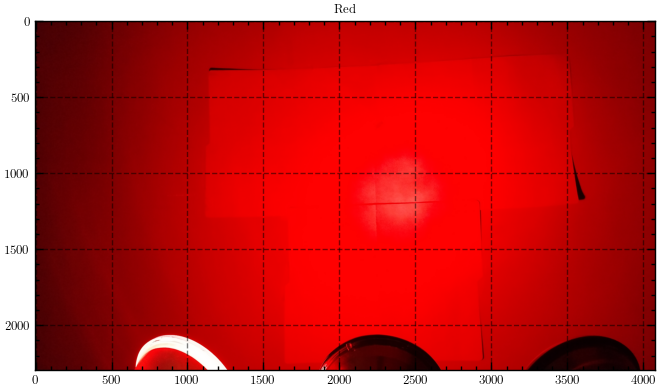

...

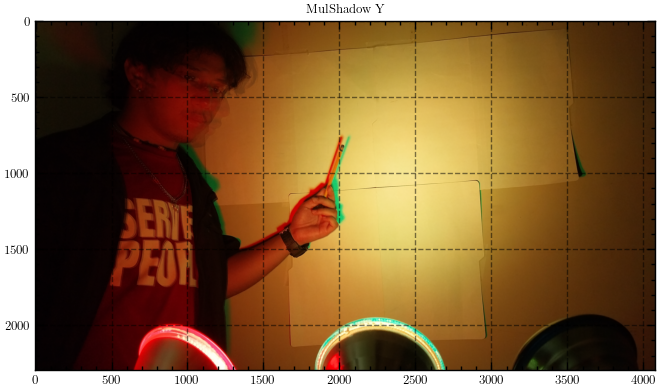

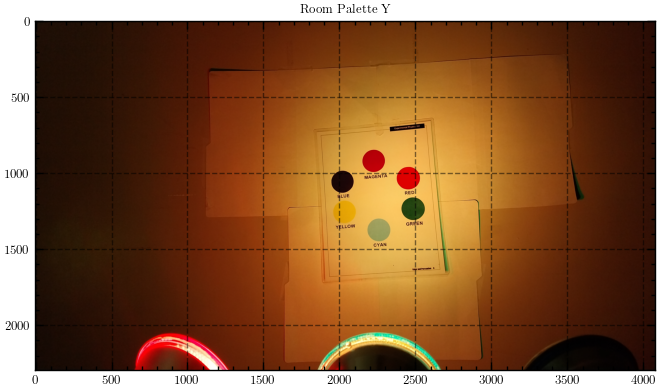

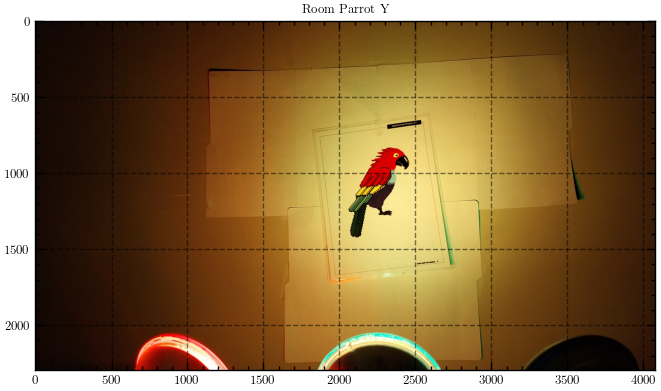

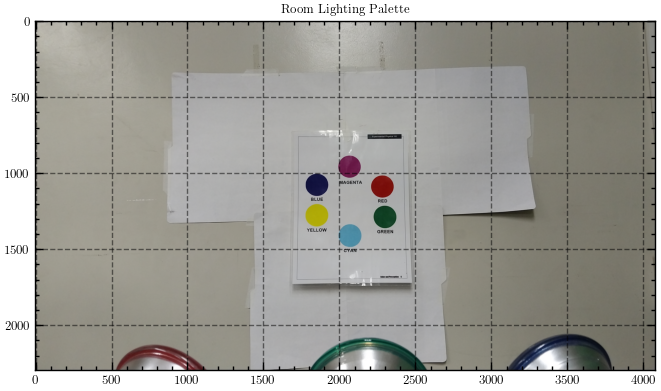

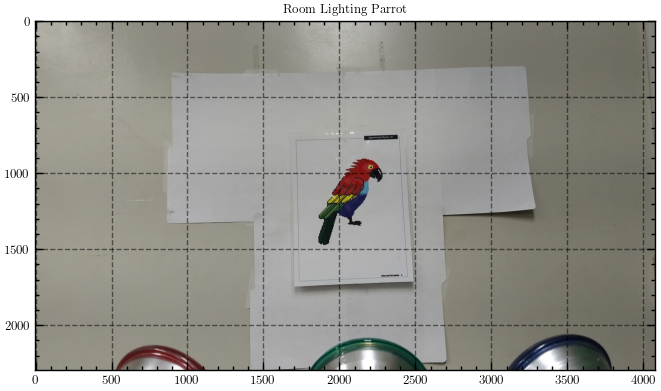

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def average3(img1_path, img2_path, img3_path, title, filename, display=True):
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)
    img3 = cv2.imread(img3_path)

    img1 = img1.astype(np.float32)
    img2 = img2.astype(np.float32)
    img3 = img3.astype(np.float32)

    avg_img = (img1 + img2 + img3) / 3
    avg_img = np.clip(avg_img, 0, 255).astype(np.uint8)

    if display:
        cv2.imwrite(rf"imgax\{filename}.png", avg_img)
        plt.imshow(avg_img[:, :, ::-1])
        plt.title(f"{title}")
        plt.show()

    return avg_img

def return_rgb(img, pos):
    y, x = pos
    return img[y, x][::-1]

# === Setup dictionaries and lists ===
base_names = ["B", "C", "G", "M", "R", "W", "Y"]

base_colors = {
    "B": "Blue",
    "C": "Cyan",
    "G": "Green",
    "M": "Magenta",
    "R": "Red",
    "W": "White",
    "Y": "Yellow"
}

img_sets = ["MS", "Palette", "Parrot"]
title_list = ["MulShadow", "Room Palette", "Room Parrot"]
filename_prefix = ["ms", "palette", "parrot"]

base_vars = {}

# === Process original base images and store ===
for base in base_names:
    color = base_colors[base]
    img_paths = [rf"imgs\{base}1.jpg", rf"imgs\{base}2.jpg", rf"imgs\{base}3.jpg"]
    base_vars[base.lower()] = average3(*img_paths, color, base)

# === Iterate over image sets ===
for base in base_names:
    for set_name, title, prefix in zip(img_sets, title_list, filename_prefix):
        img1 = rf"imgs\{set_name}_{base}1.jpg"
        img2 = rf"imgs\{set_name}_{base}2.jpg"
        img3 = rf"imgs\{set_name}_{base}3.jpg"
        outname = f"{prefix}_{base}"
        average3(img1, img2, img3, f"{title} {base}", outname)

# === Special case: Room lighting variants ===
room_palette = average3(
    r"imgs\Room_Colors_1.jpg",
    r"imgs\Room_Colors_2.jpg",
    r"imgs\Room_Colors_3.jpg",
    "Room Lighting Palette",
    "room_palette"
)

room_parrot = average3(
    r"imgs\Room_Parrot_1.jpg",
    r"imgs\Room_Parrot_2.jpg",
    r"imgs\Room_Parrot_3.jpg",
    "Room Lighting Parrot",
    "room_parrot"
)


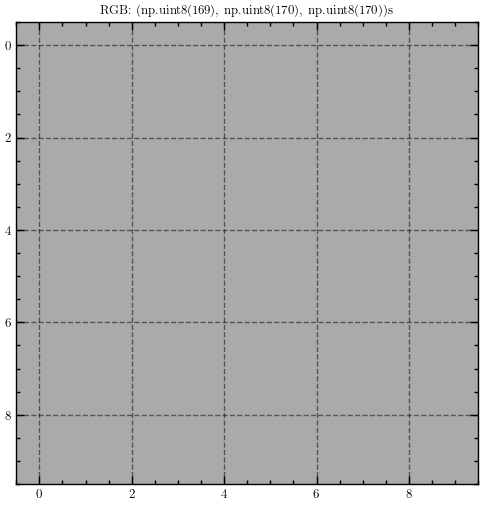

(np.uint8(169), np.uint8(170), np.uint8(170))

In [25]:
return_rgb(room_palette, [2000,1500]) 

In [38]:
from PIL import Image
def rgb_histogram(
        image_path,
        ymax = 9367680
    ):
    """
    Loads an image, computes RGB histograms, and automatically plots them using plt.hist with 'step' style.
    """
    img = Image.open(image_path).convert("RGB")
    img_array = np.array(img)

    # Flatten the 2D image to 1D arrays for each channel
    r_values = img_array[:, :, 0].flatten()
    g_values = img_array[:, :, 1].flatten()
    b_values = img_array[:, :, 2].flatten()

    # Plotting the histograms using 'step' style
    plt.figure(figsize=(5, 4))
    plt.title("RGB Histogram")
    plt.hist(r_values, bins=256, color='red', alpha=0.8, label='R', range=(0, 256), histtype='step', linewidth=2)
    plt.hist(g_values, bins=256, color='green', alpha=0.8, label='G', range=(0, 256), histtype='step', linewidth=2)
    plt.hist(b_values, bins=256, color='blue', alpha=0.8, label='B', range=(0, 256), histtype='step', linewidth=2)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.xlim(0,256)
    plt.ylim(0,ymax)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.imshow(img_array)


In [39]:
img = Image.open(r"imgax\R.png").convert("RGB")
print(img.size)
print(img.size[0]*img.size[1])


(4080, 2296)
9367680


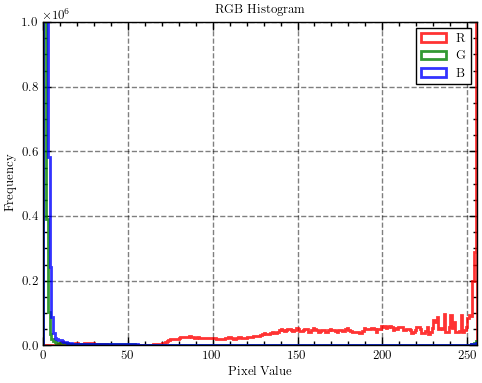

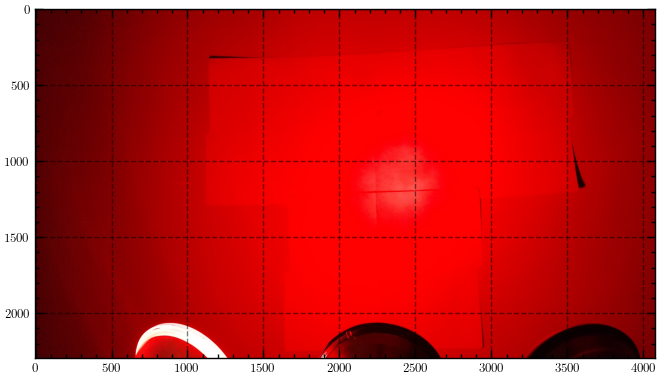

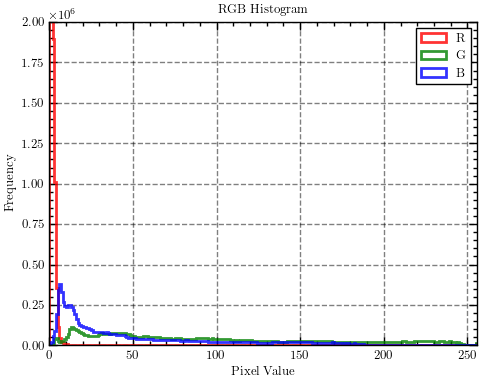

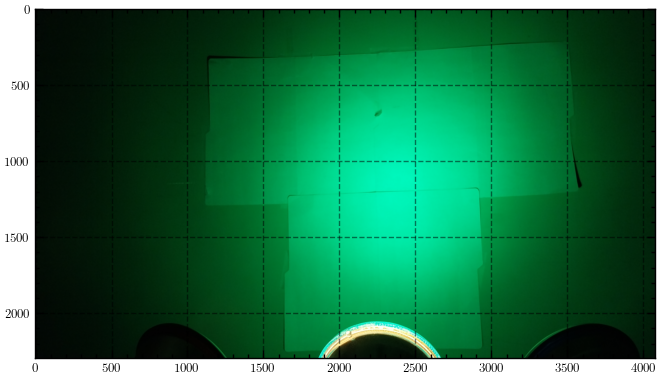

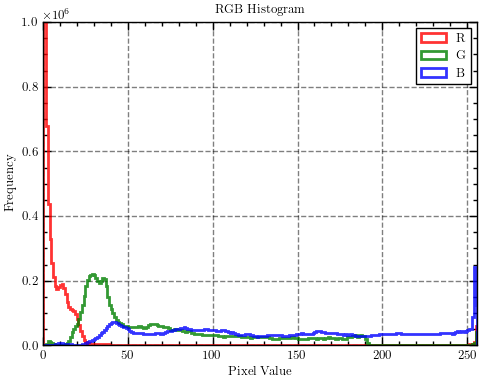

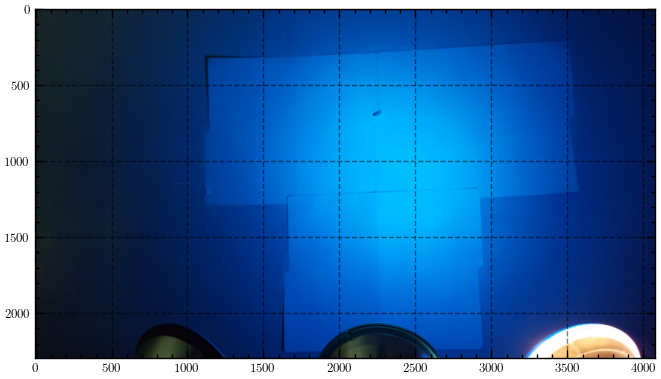

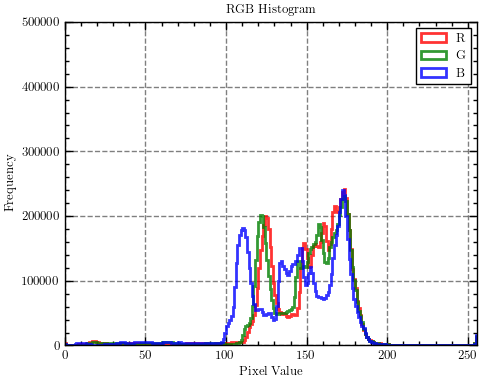

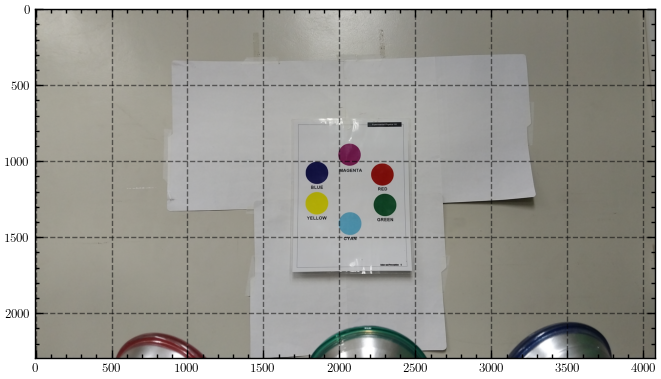

In [41]:

rgb_histogram(r"imgax\R.png",1e6)
rgb_histogram(r"imgax\G.png",2e6)
rgb_histogram(r"imgax\B.png",1e6)
rgb_histogram(r"imgax\room_palette.png",5e5)